In [1]:
import os
os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1

import numpy as np
import matplotlib.pyplot as plt
import multisite.fitting as fitting
import multisite.multielec_utils as mutils
from scipy.io import loadmat, savemat
import multiprocessing as mp
import statsmodels.api as sm
from copy import deepcopy, copy
import visionloader as vl
from mpl_toolkits.mplot3d import Axes3D
import visionloader as vl
import multisite.eilib as eil

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# Paths to data
GSORT_BASE = "/Volumes/Scratch/Analysis"
WNOISE_ANALYSIS_BASE = "/Volumes/Analysis"
ESTIM_ANALYSIS_BASE = "/Volumes/Analysis"
dataset = "2020-10-18-0"
wnoise = "kilosort_data000/data000"

# Fitting parameters
spont_limit = 0.2
min_active_inds = 200
min_clean_inds = 175
ms = [1, 2, 3, 4, 5, 6]
slope_bound = 20
zero_prob = 0.01
R2_thresh = 0.05

# Load vision data
vstim_datapath = os.path.join(WNOISE_ANALYSIS_BASE, dataset, wnoise)
vstim_datarun = os.path.basename(os.path.normpath(vstim_datapath))
vcd = vl.load_vision_data(vstim_datapath, vstim_datarun,
                          include_neurons=True,
                          include_ei=True,
                          include_params=True,
                          include_noise=True)
coords = vcd.electrode_map

# Load electrical data and g-sort data
estim_neg = "data003/data003-all"

outpath = os.path.join(GSORT_BASE, dataset, estim_neg, wnoise)
electrical_path = os.path.join(ESTIM_ANALYSIS_BASE, dataset, estim_neg)
parameters = loadmat(os.path.join(outpath, 'parameters.mat'))

cells = parameters['cells'].flatten()
patterns = parameters['patterns'].flatten()
num_cells = len(cells)
num_patterns = max(patterns)
num_movies = parameters['movies'].flatten()[0]

all_probs = np.nan_to_num(np.array(np.memmap(os.path.join(outpath, 'init_probs.dat'),
                                            mode='r',shape=(num_cells, num_patterns, num_movies), dtype='float32')))
trials = np.array(np.memmap(os.path.join(outpath, 'trial.dat'),mode='r',shape=(num_patterns, num_movies), dtype='int16'), dtype=int)
amps = np.array([mutils.get_stim_amps_newlv(electrical_path, patterns[0])] * len(trials))
probs_pred_true = np.zeros(all_probs.shape)
params_true_array = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)

params_list_separated = np.zeros(all_probs.shape[1], dtype=object)
for j in range(len(params_list_separated)):
    params_list_separated[j]= []

3 2
6 2


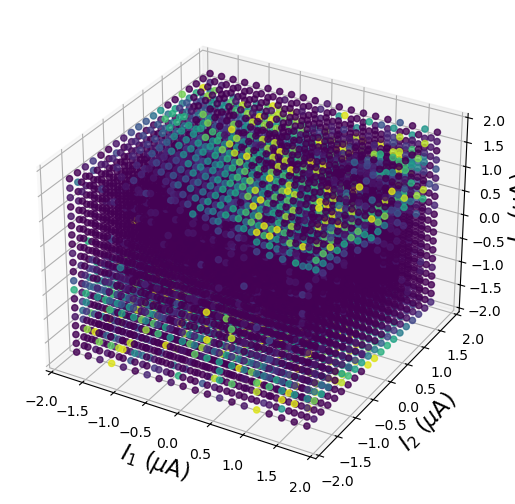

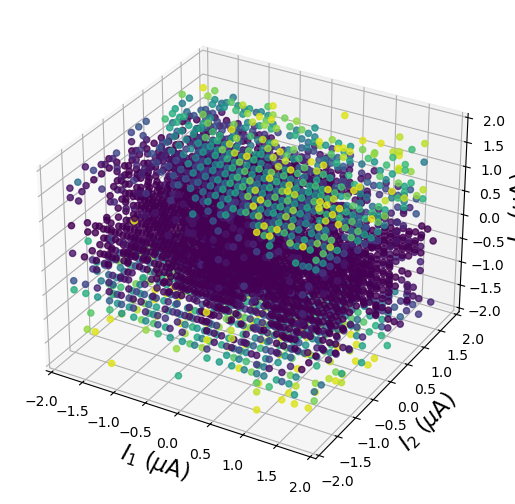

[[-7.96728959 -1.61424806 -1.36291495 -6.52922908]
 [-8.68869853  1.58201129  1.32984258  5.78957867]]
Tjur R2 = 0.453


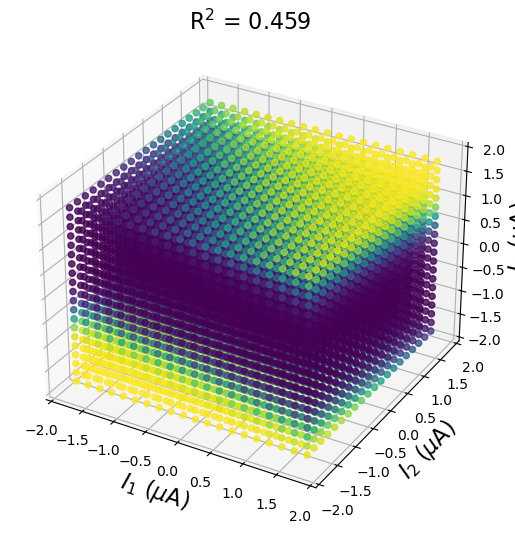

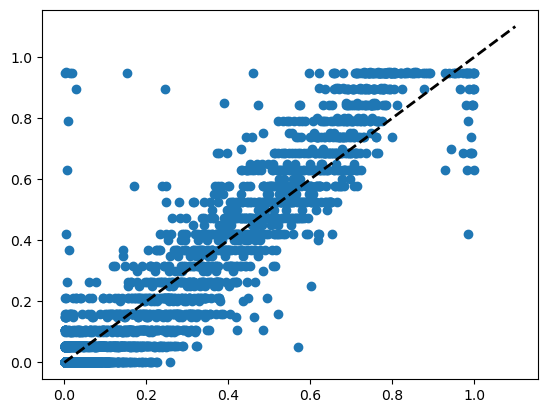

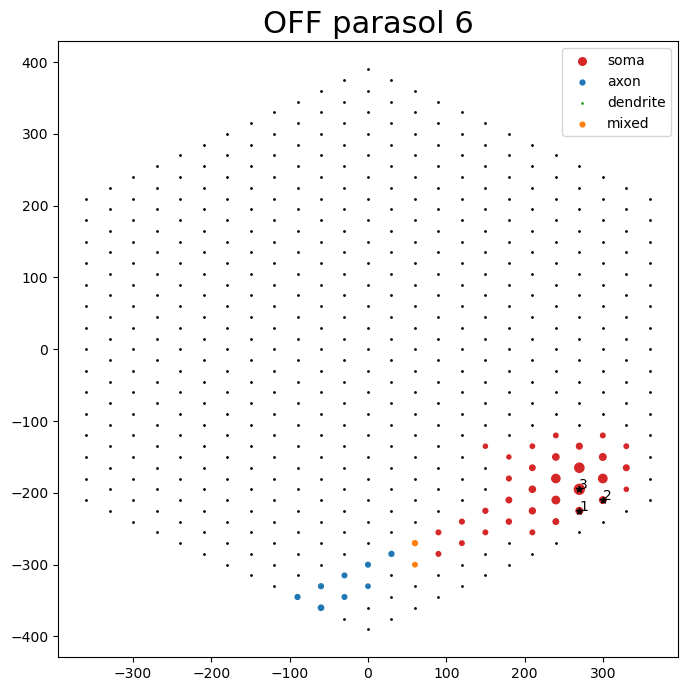

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]])])
 list([])]
11 2


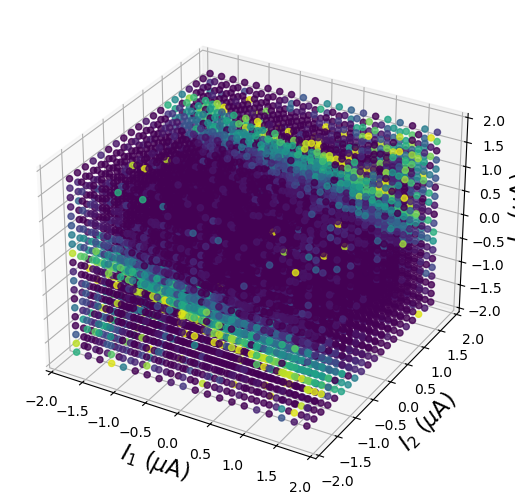

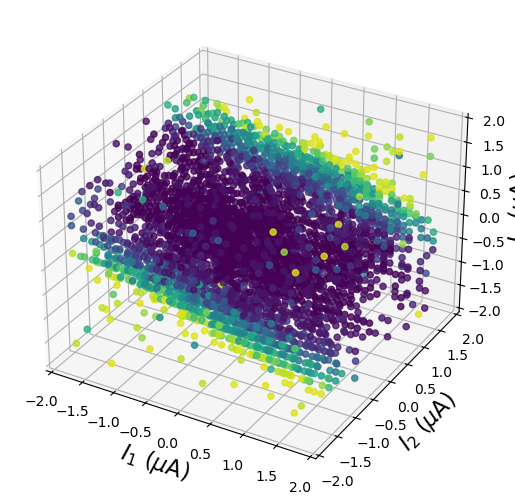

[[-5.33209781  0.74892752  2.59587333  2.53772803]
 [-5.34072629 -1.06995205 -2.88137146 -2.88567786]]
Tjur R2 = 0.362


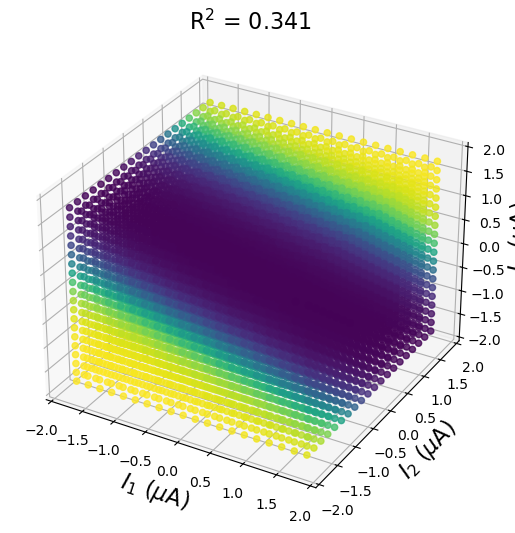

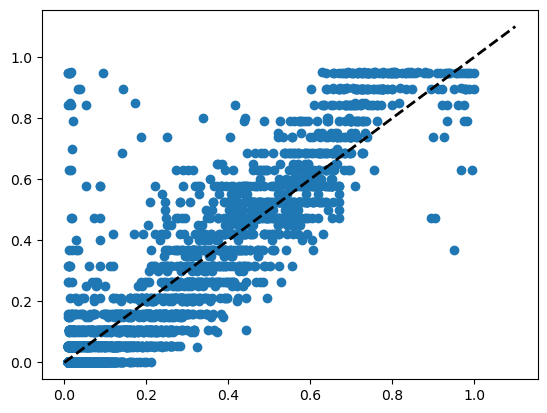

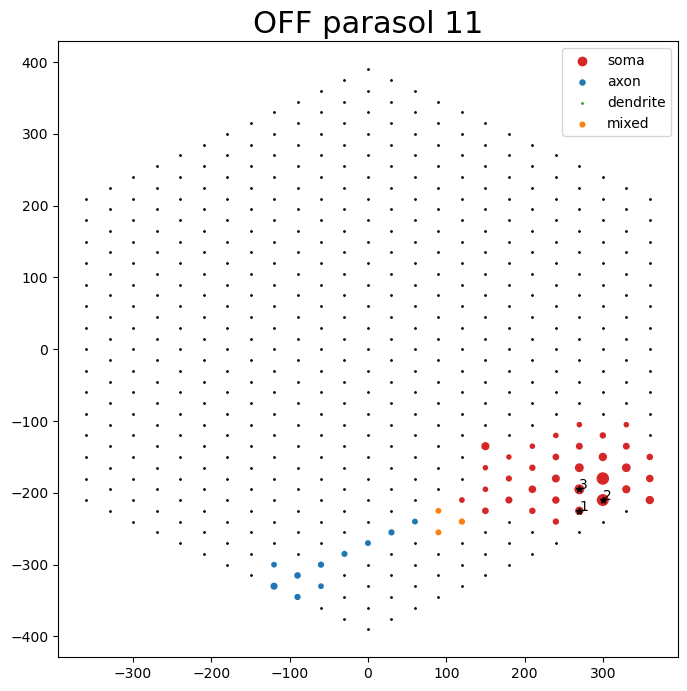

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]])])
 list([])]
12 2


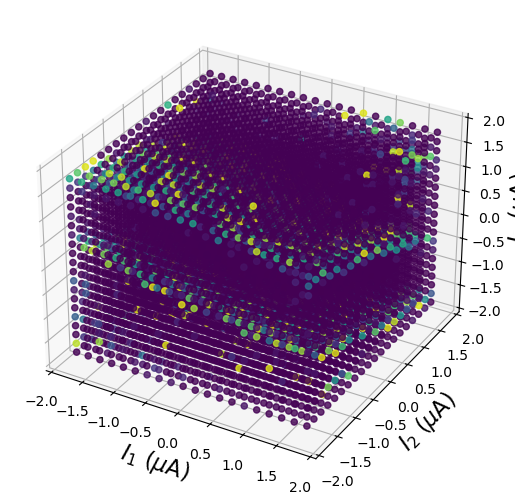

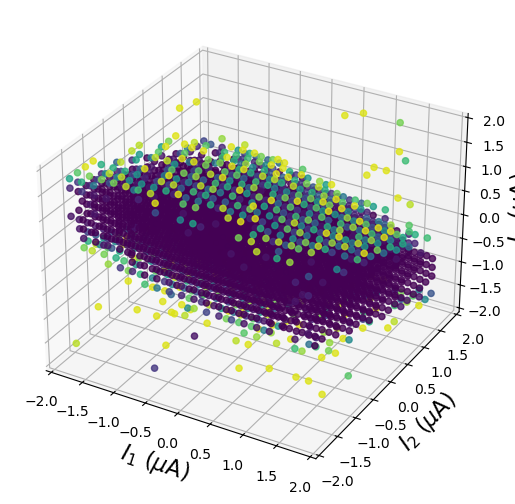

[[ -8.84328726  -2.50492745  -4.38259553 -11.67113453]
 [-11.6281739    2.87678457   5.22096118  12.93969476]]
Tjur R2 = 0.534


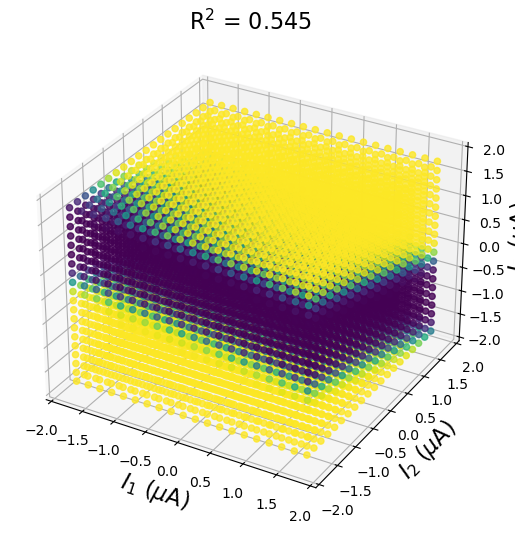

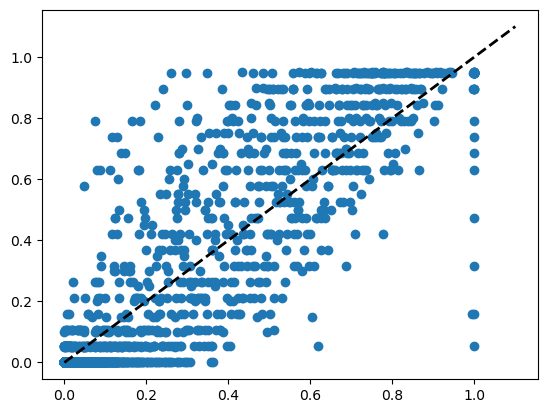

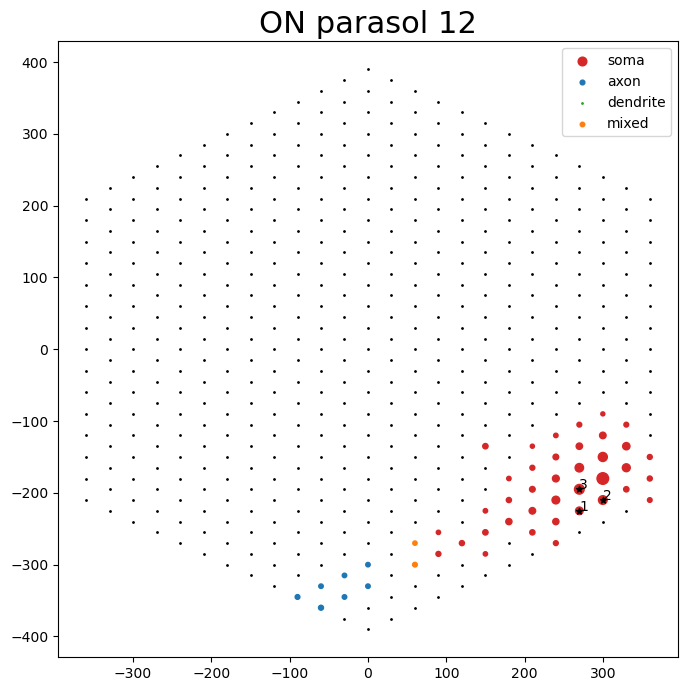

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]])])
 list([])]
14 2


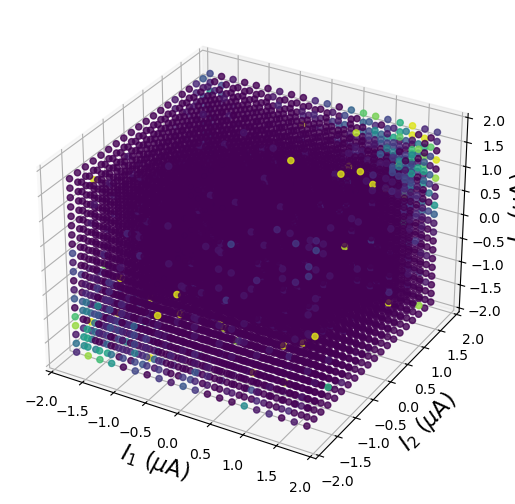

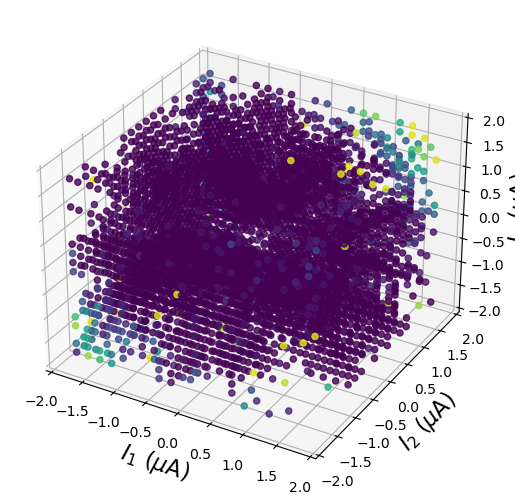

[[-23.47932456 -10.52431986   2.74911888  -1.17524888]
 [ -7.90847174   1.78704067   2.05626697   1.36533125]
 [ -6.95301098  -0.4493171   -2.05845664  -1.22677644]]
Tjur R2 = 0.208


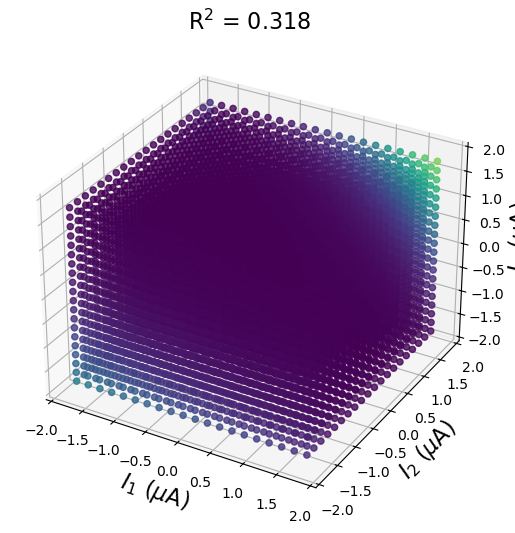

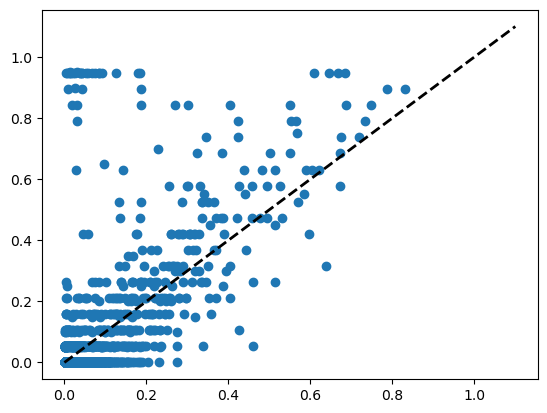

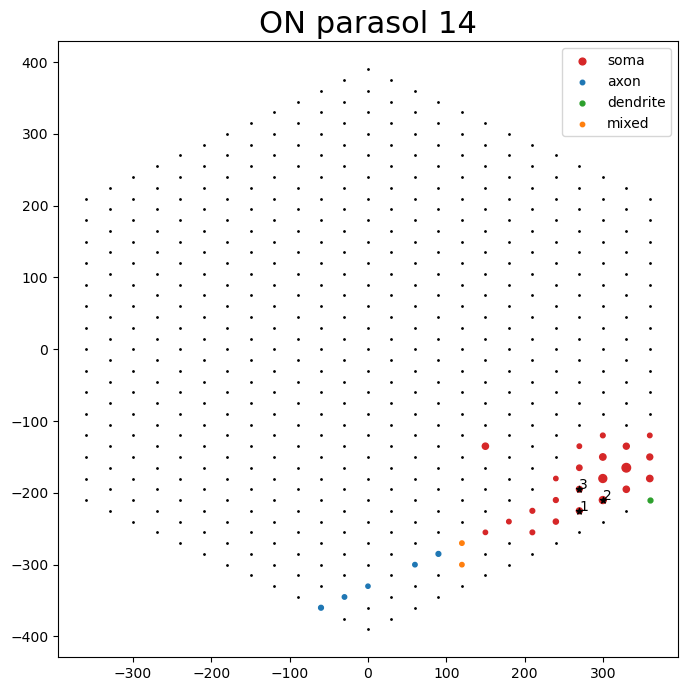

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([])]
72 3


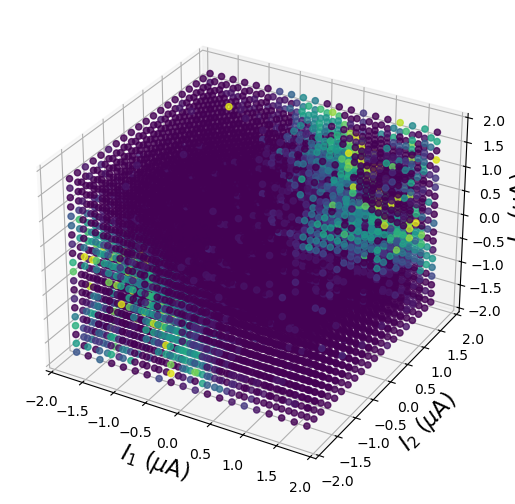

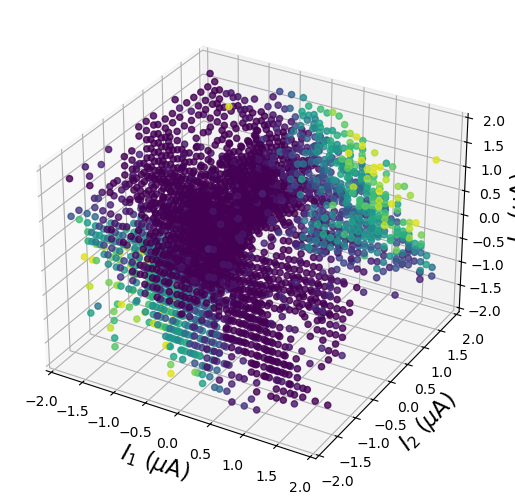

[[-7.54112971 -3.33409619 -2.11910297 -2.70758371]
 [-7.21713459  3.14585612  2.02949239  2.34367109]]
Tjur R2 = 0.376


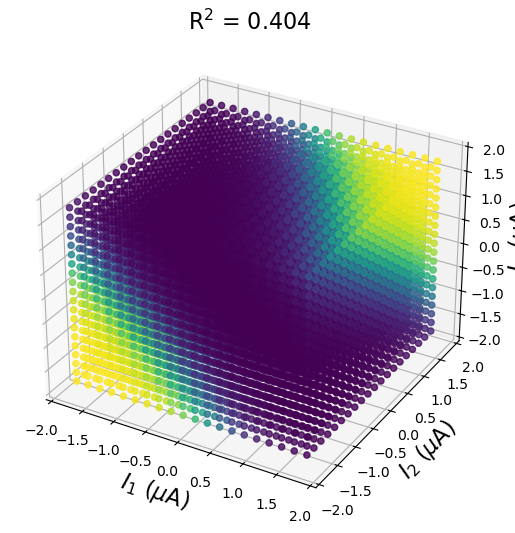

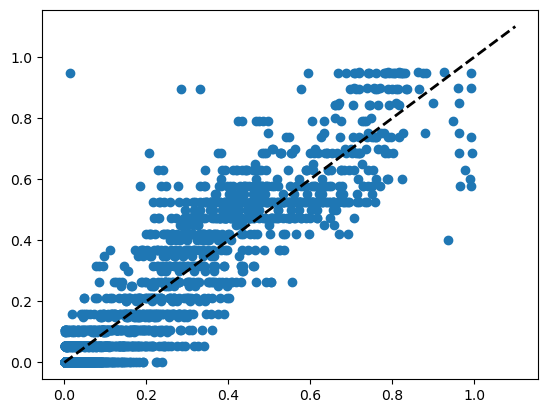

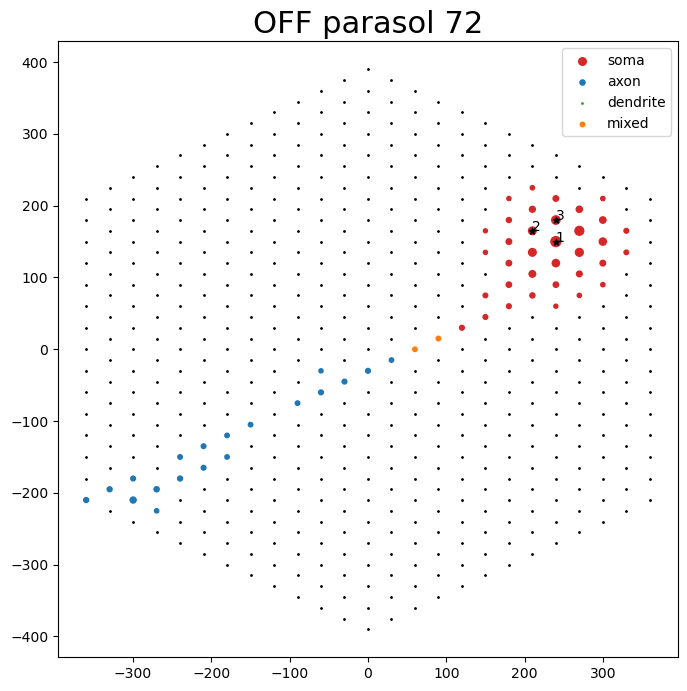

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]])])   ]
74 3


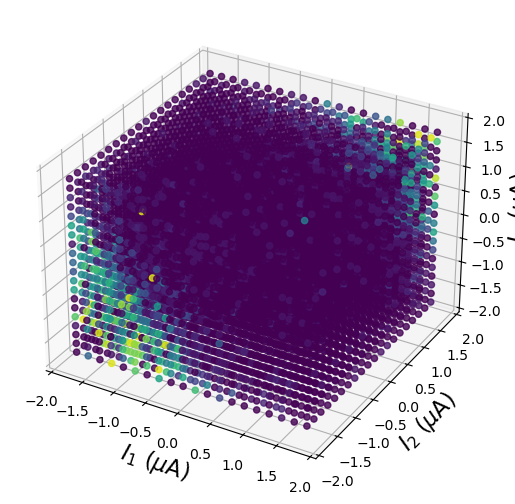

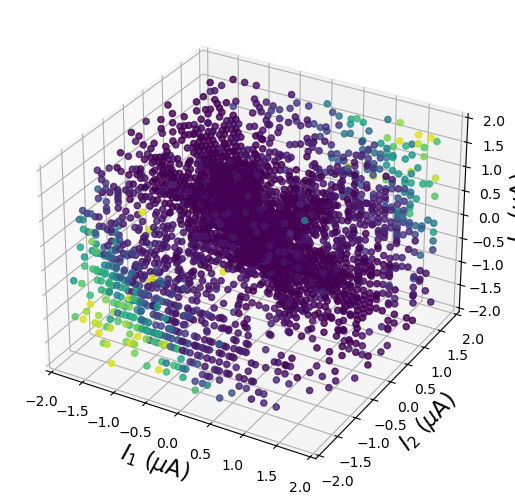

[[-5.624086   -1.62577597 -1.98705754 -1.09865241]
 [-6.23194044  1.4078232   2.01384066  1.07554259]]
Tjur R2 = 0.298


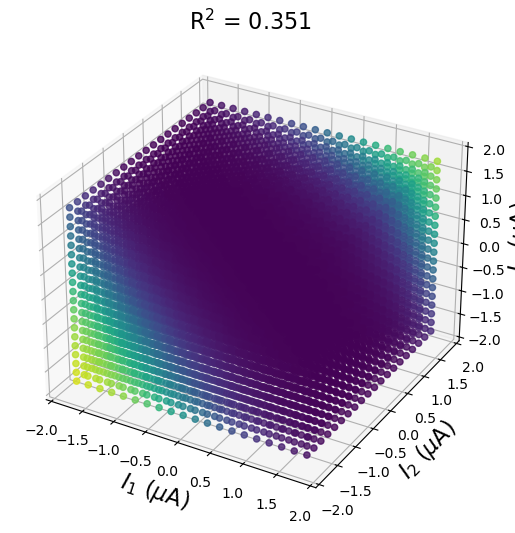

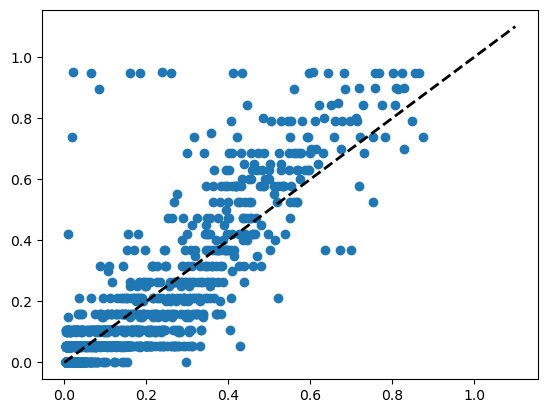

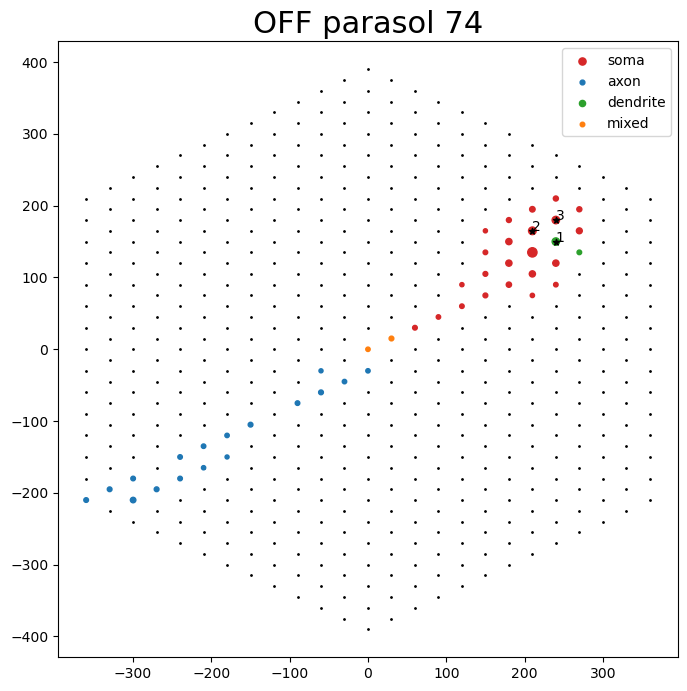

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]]), array([[-5.624086  , -1.62577597, -1.98705754, -1.09865241],
        [-6.23194044,  1.4078232 ,  2.01384066,  1.07554259]])])                                                            ]
75 3


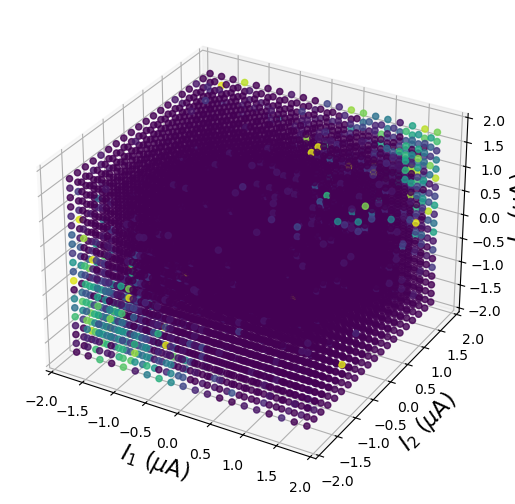

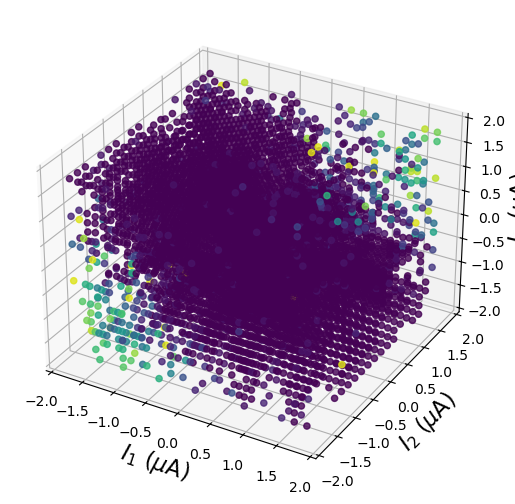

[[-8.73246508 -2.21656331 -2.68727536 -1.58367394]
 [-7.30156427  1.77214714  1.82230694  1.64632705]]
Tjur R2 = 0.287


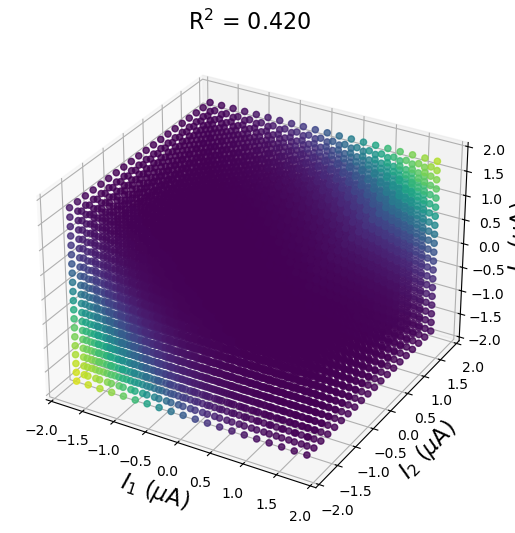

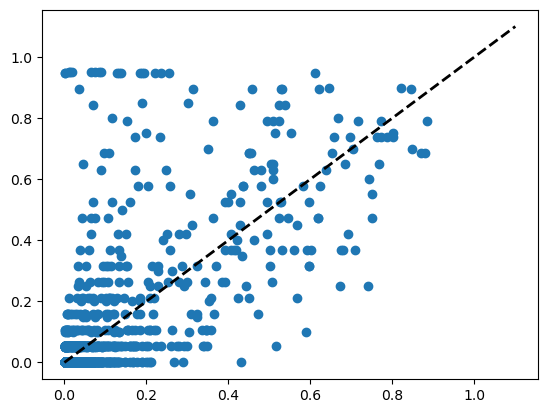

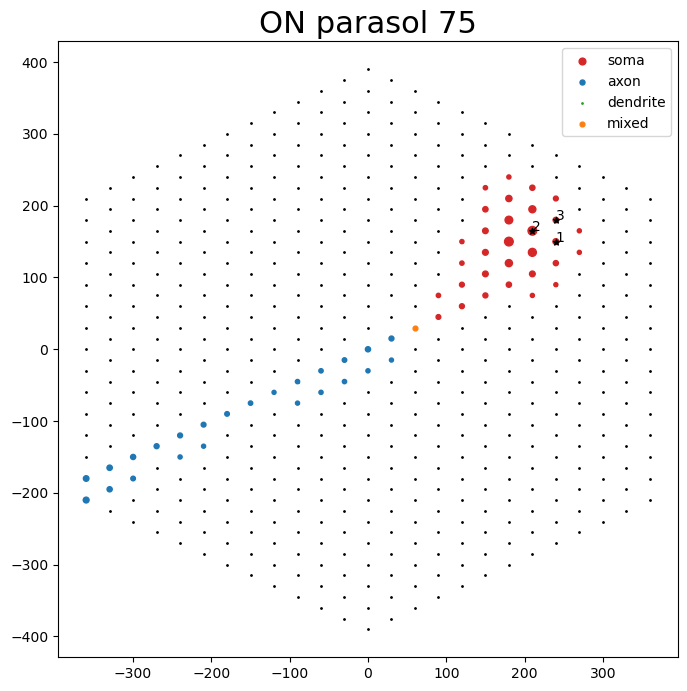

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]]), array([[-5.624086  , -1.62577597, -1.98705754, -1.09865241],
        [-6.23194044,  1.4078232 ,  2.01384066,  1.07554259]]), array([[-8.73246508, -2.21656331, -2.68727536, -1.58367394],
        [-7.30156427,  1.77214714,  1.82230694,  1.64632705]])])                  

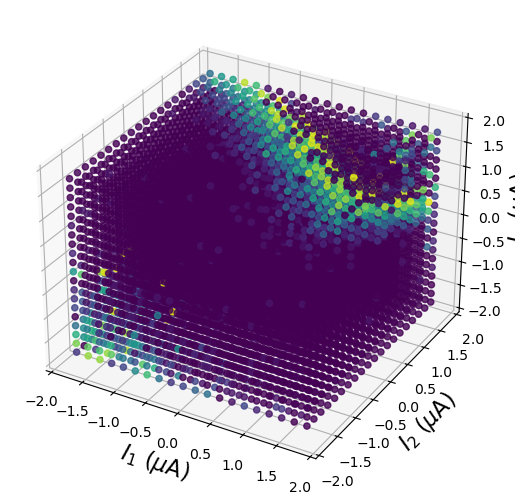

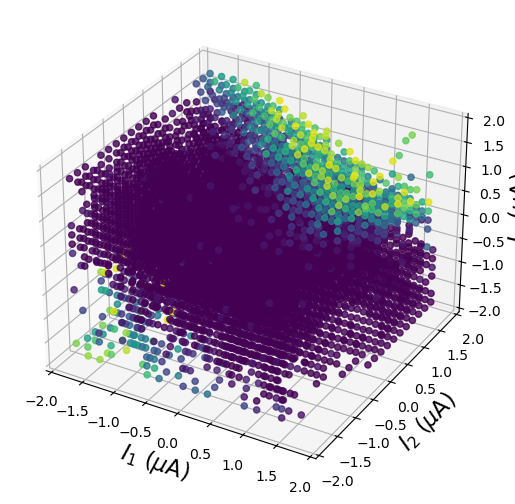

[[ -8.81688931  -1.91774913  -1.97320276  -2.37701111]
 [-11.35470901   2.79278093   3.25645744   5.71748304]]
Tjur R2 = 0.453


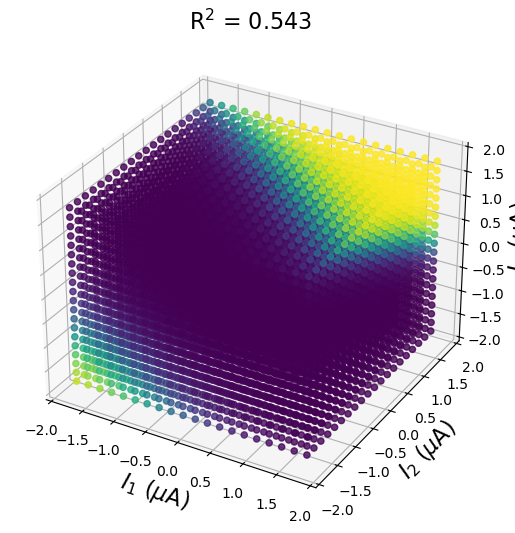

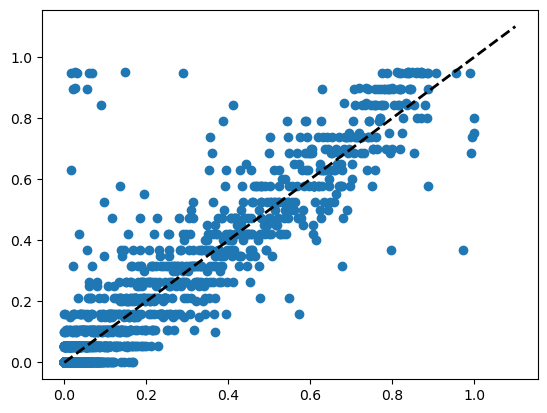

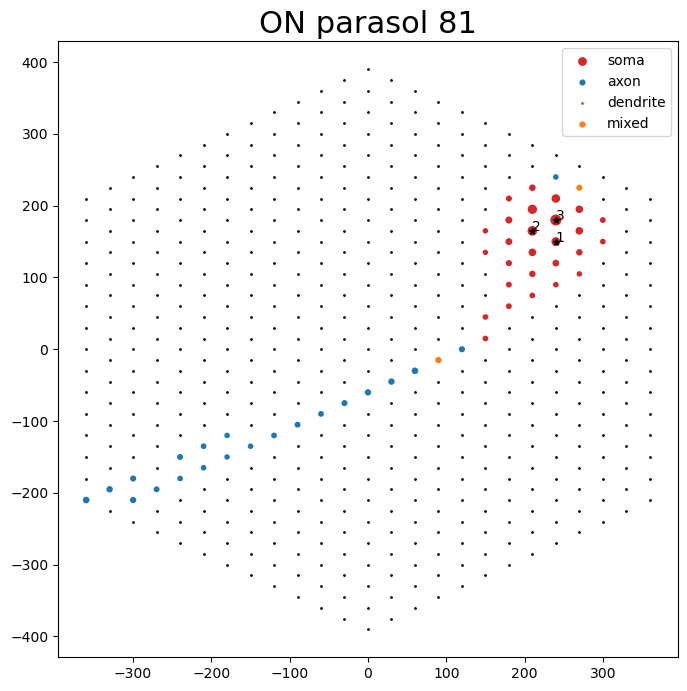

[list([])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]]), array([[-5.624086  , -1.62577597, -1.98705754, -1.09865241],
        [-6.23194044,  1.4078232 ,  2.01384066,  1.07554259]]), array([[-8.73246508, -2.21656331, -2.68727536, -1.58367394],
        [-7.30156427,  1.77214714,  1.82230694,  1.64632705]]), array([[ -8.816889

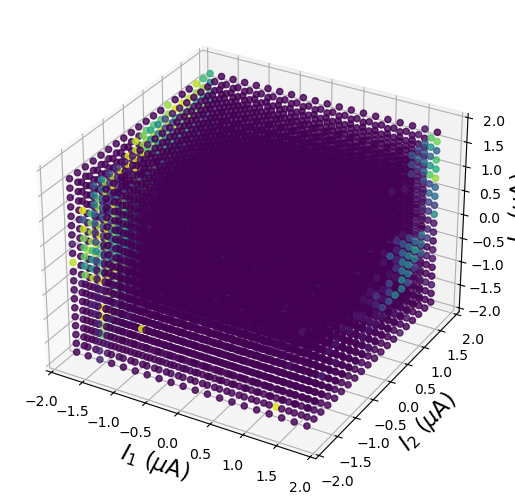

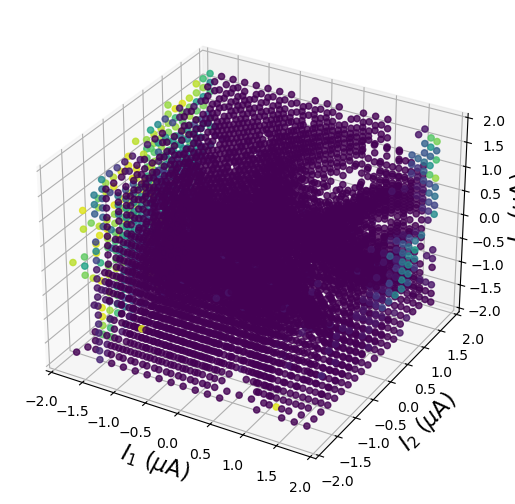

[[-12.06876557   4.83989942   1.04262341   0.23450289]
 [-20.57348067 -12.34409312  -1.28731713   0.85863002]]
Tjur R2 = 0.475


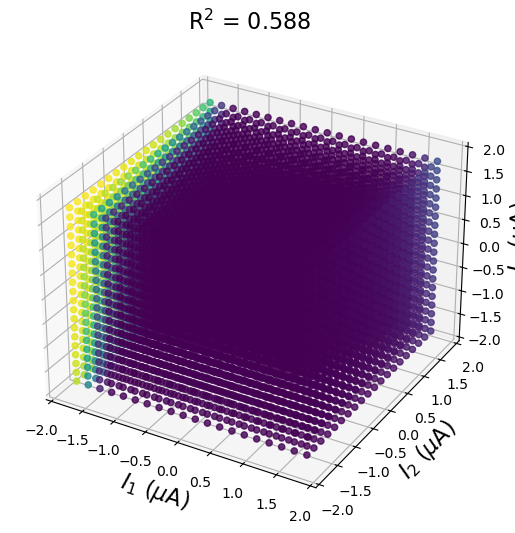

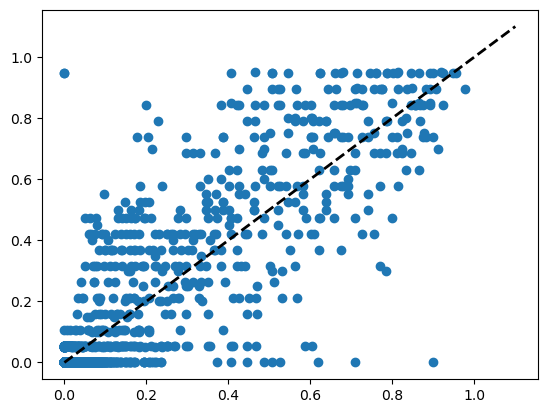

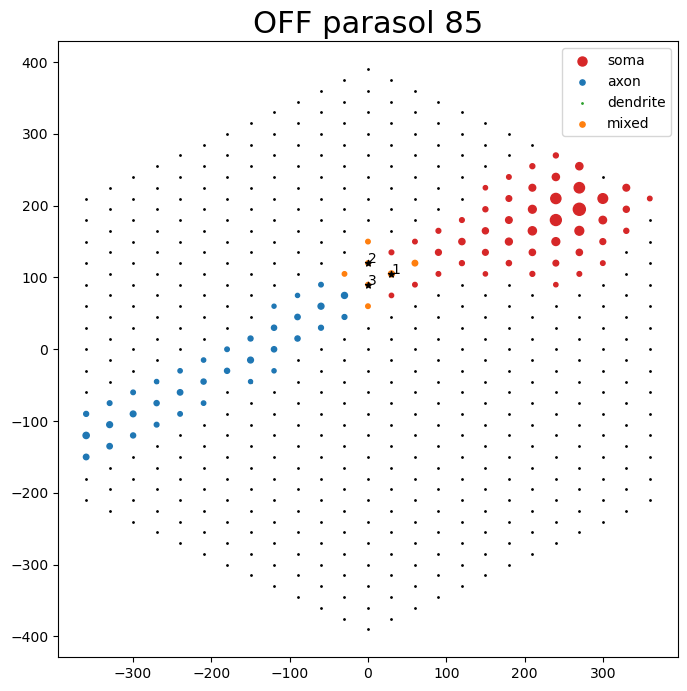

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]]), array([[-5.624086  , -1.62577597, -1.98705754, -1.09865241],
        [-6.23194044,  1.4078232 ,  2.01384066,  1.07554259]]), array([[-8.7

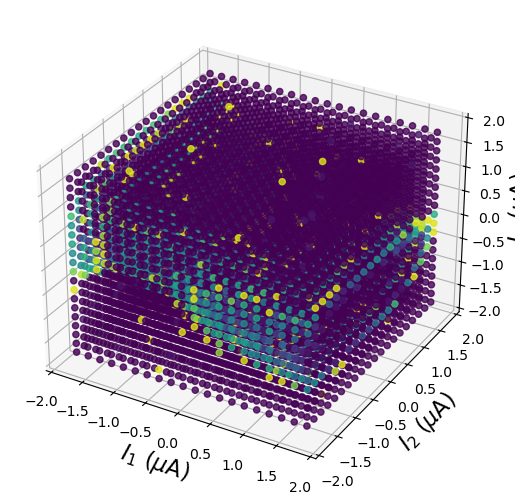

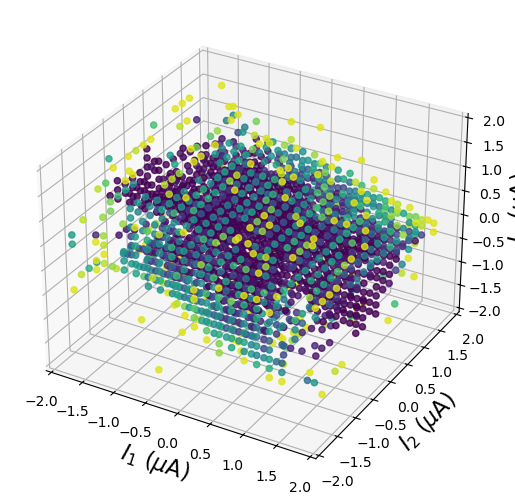

[[ -5.98518703  -2.17395983   0.03612335  -9.21036388]
 [-11.01996159   0.79126424   6.30674796  -2.8558408 ]
 [ -8.81955315  -0.74897696  -5.55568528   1.41134474]
 [ -8.87046364   3.33633268   1.04957392  11.19880085]]
Tjur R2 = 0.420


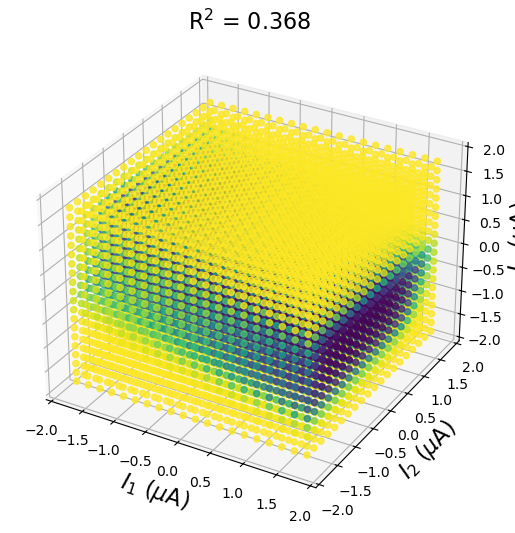

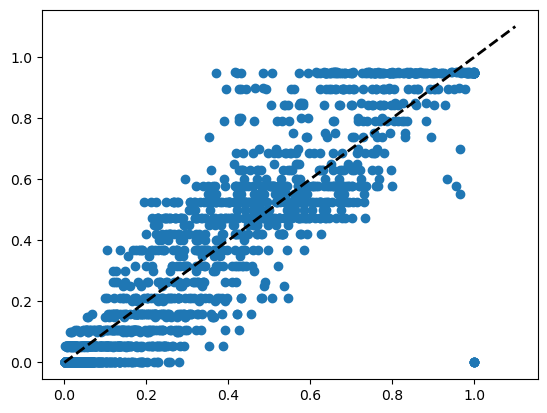

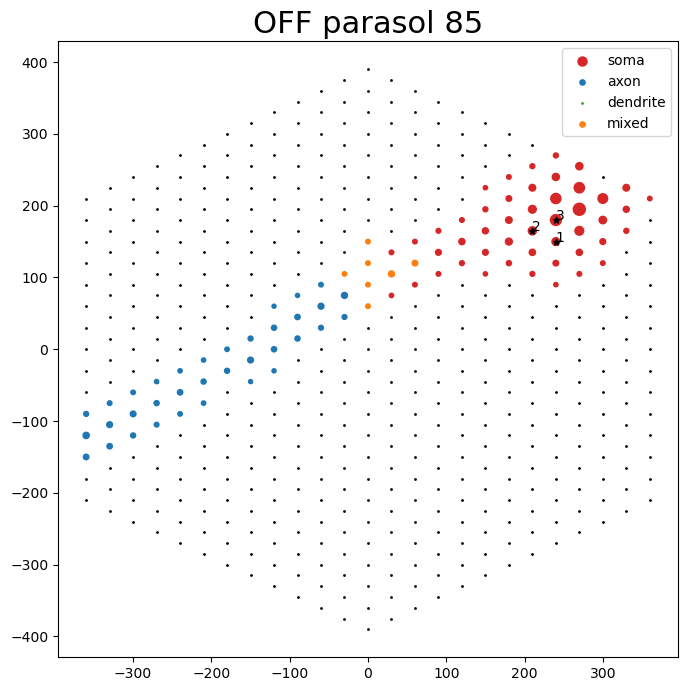

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 list([array([[-7.54112971, -3.33409619, -2.11910297, -2.70758371],
        [-7.21713459,  3.14585612,  2.02949239,  2.34367109]]), array([[-5.624086  , -1.62577597, -1.98705754, -1.09865241],
        [-6.23194044,  1.4078232 ,  2.01384066,  1.07554259]]), array([[-8.7

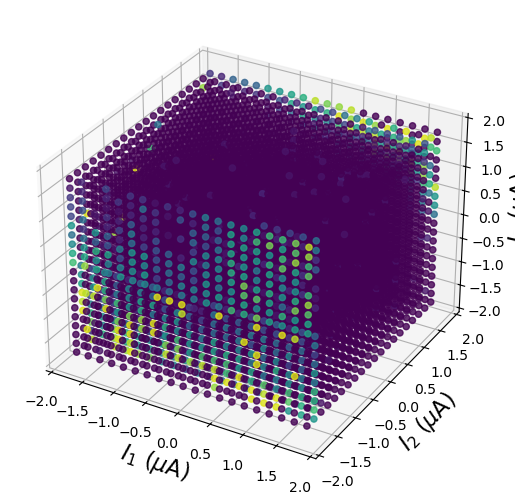

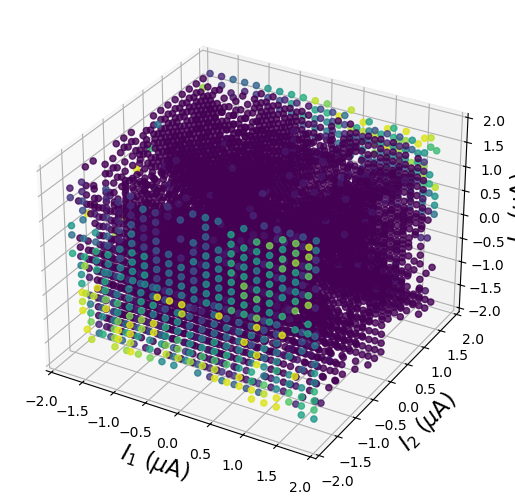

[[-33.01153679  -1.27289589 -18.49569303  -3.86151305]
 [ -6.00283006  -0.7817915    0.07087002   0.18051153]
 [-25.71253613   1.16947929 -14.0923104   -0.30598225]
 [-33.20675928   2.35709623  15.54795149   3.95934556]]
Tjur R2 = 0.504


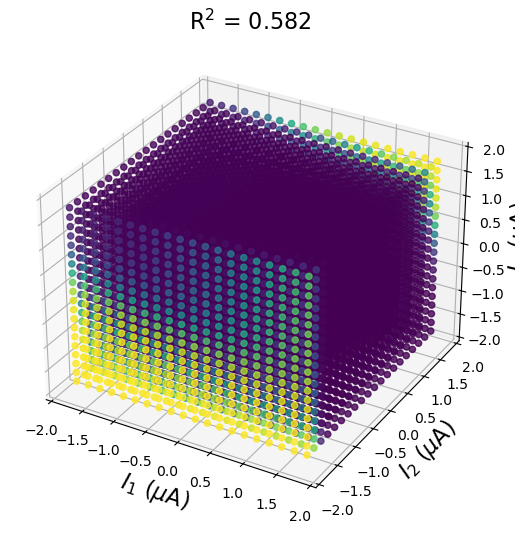

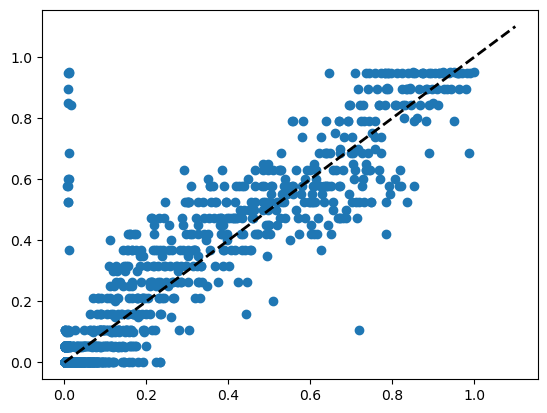

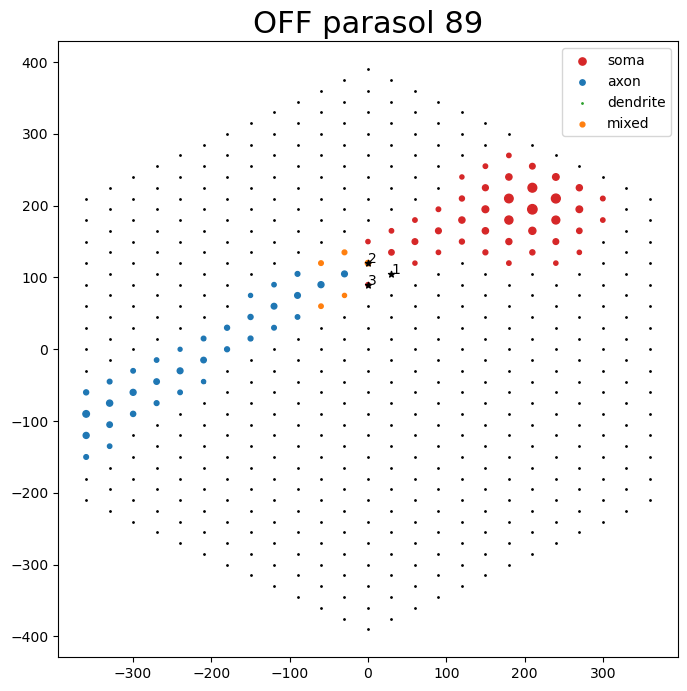

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]]), array([[-33.01153679,  -1.27289589, -18.49569303,  -3.86151305],
        [ -6.00283006,  -0.7817915 ,   0.07087002,   0.18051153],
        [-25.71253613,   1.16947929, -14.0923104 ,  -0.30598225],
        [-33.20675928,   2.35709623,  15.54795149,   3.95934556]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
        [ -7.90847174,   1.78704067,   2.05626697,   1.36533125],
        [ -6.95301098,  -0.4493171 ,  -2.05845664,  -1.22677644]])])
 lis

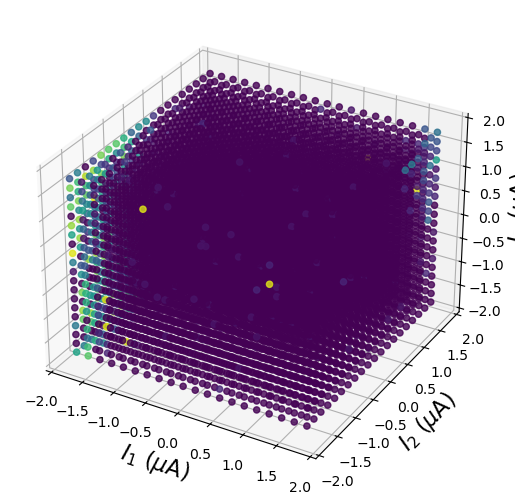

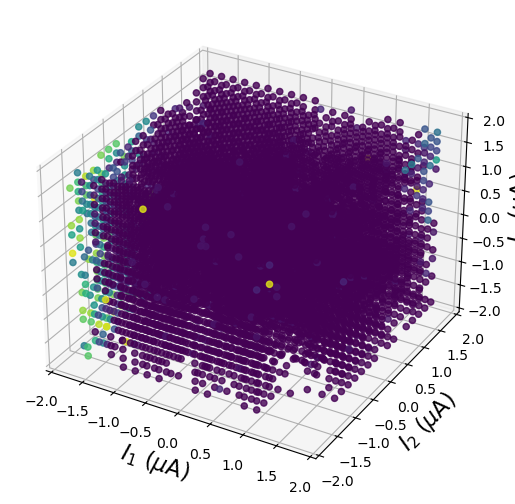

[[-20.85818615 -10.64375098  -2.13276232  -0.20171107]
 [ -7.26866745   1.28658767   0.55590654   0.7551569 ]]
Tjur R2 = 0.369


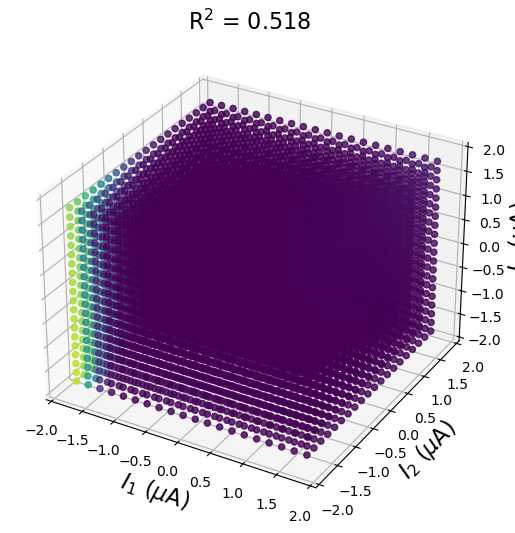

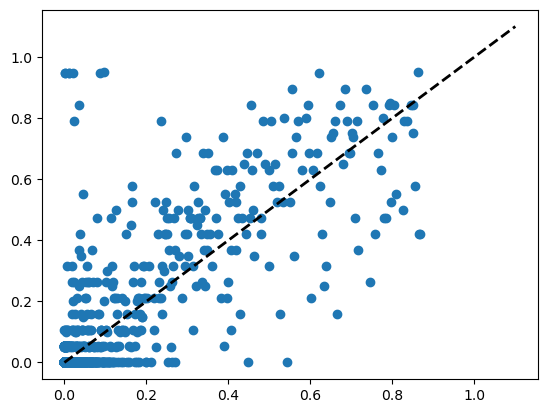

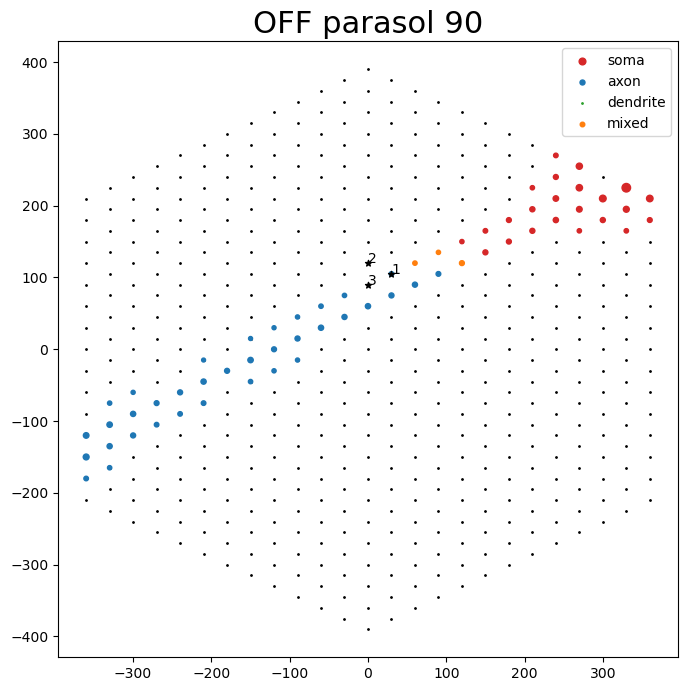

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]]), array([[-33.01153679,  -1.27289589, -18.49569303,  -3.86151305],
        [ -6.00283006,  -0.7817915 ,   0.07087002,   0.18051153],
        [-25.71253613,   1.16947929, -14.0923104 ,  -0.30598225],
        [-33.20675928,   2.35709623,  15.54795149,   3.95934556]]), array([[-20.85818615, -10.64375098,  -2.13276232,  -0.20171107],
        [ -7.26866745,   1.28658767,   0.55590654,   0.7551569 ]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6281739 ,   2.87678457,   5.22096118,  12.93969476]]), array([[-23.47932456, -10.52431986,   2.74911888,  -1.17524888],
      

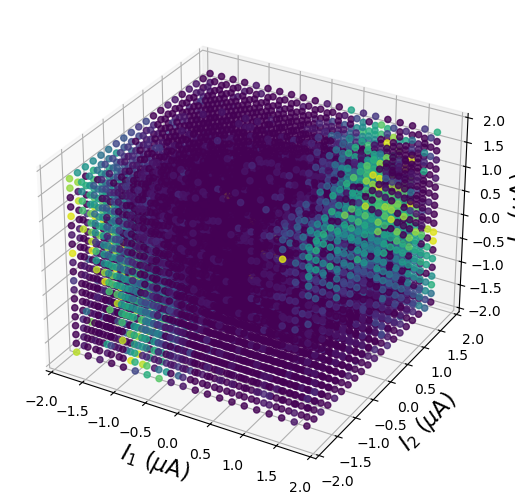

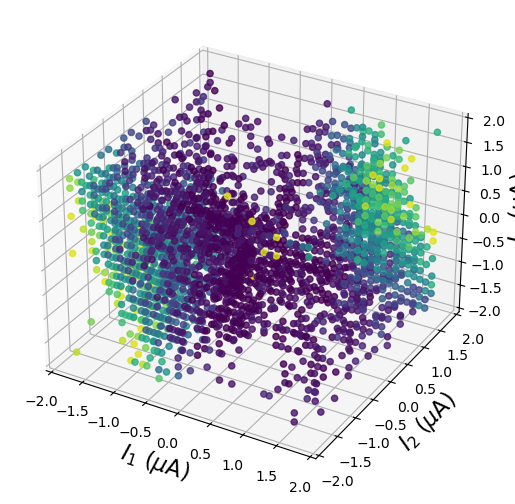

[[-5.62949463 -3.31168343 -1.14878262 -1.12292231]
 [-5.29078277  2.62972278  0.94930385  1.06330158]]
Tjur R2 = 0.298


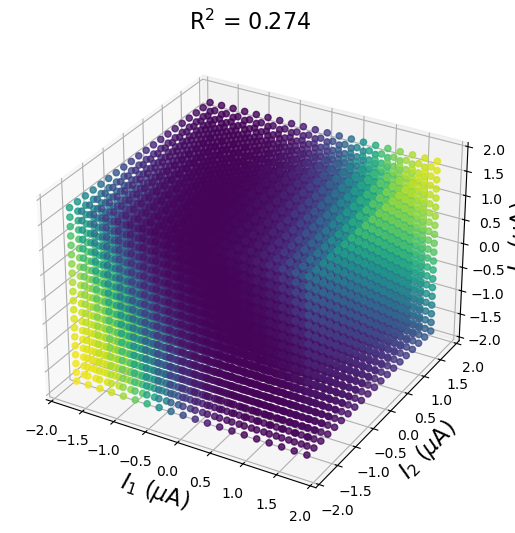

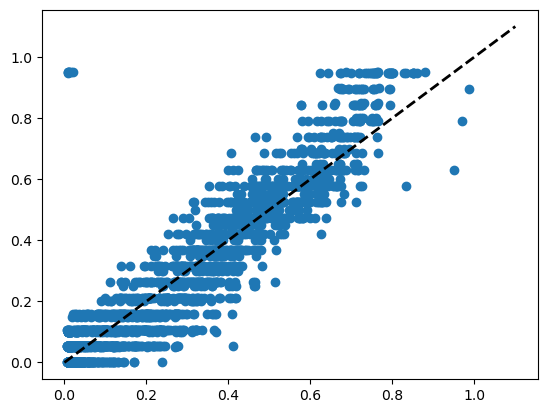

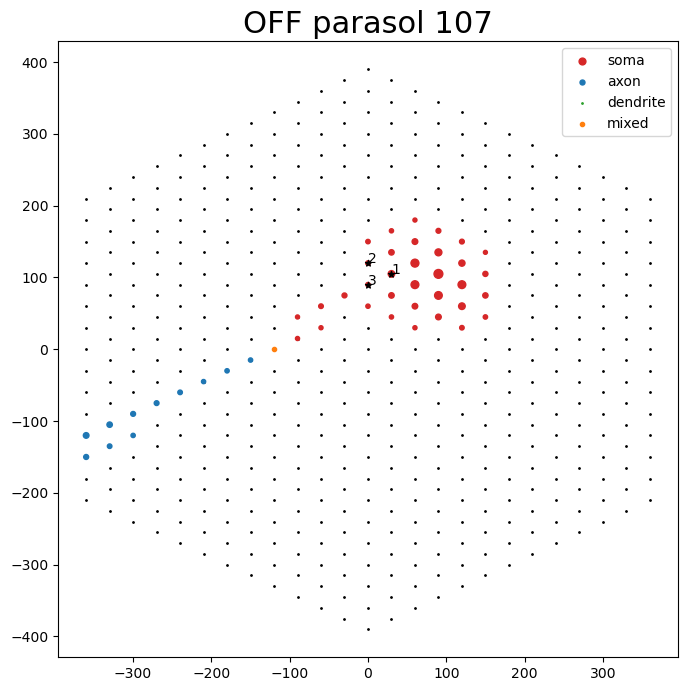

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]]), array([[-33.01153679,  -1.27289589, -18.49569303,  -3.86151305],
        [ -6.00283006,  -0.7817915 ,   0.07087002,   0.18051153],
        [-25.71253613,   1.16947929, -14.0923104 ,  -0.30598225],
        [-33.20675928,   2.35709623,  15.54795149,   3.95934556]]), array([[-20.85818615, -10.64375098,  -2.13276232,  -0.20171107],
        [ -7.26866745,   1.28658767,   0.55590654,   0.7551569 ]]), array([[-5.62949463, -3.31168343, -1.14878262, -1.12292231],
        [-5.29078277,  2.62972278,  0.94930385,  1.06330158]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6

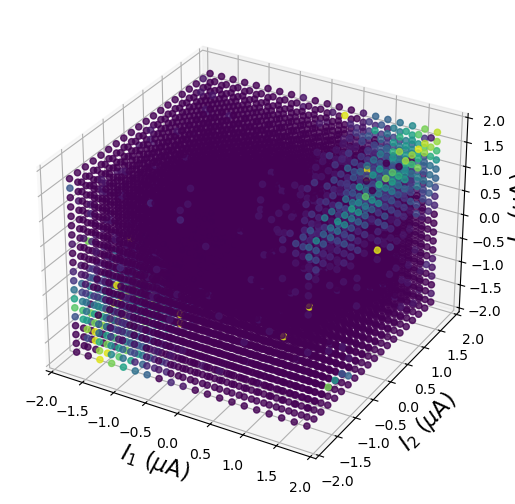

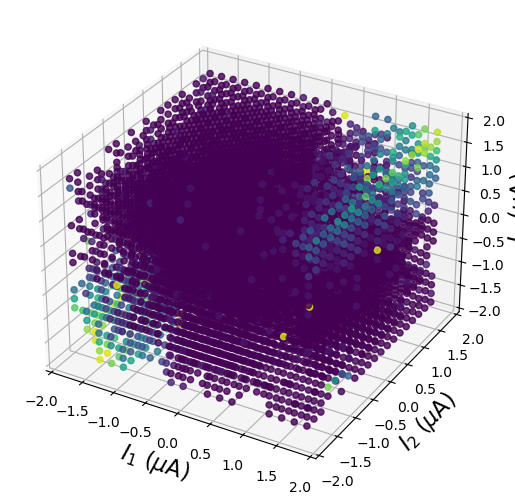

[[ -9.27324387   3.19122236   0.69044758   2.11873352]
 [-10.96819352  -4.49612506  -0.58032293  -2.86907393]]
Tjur R2 = 0.373


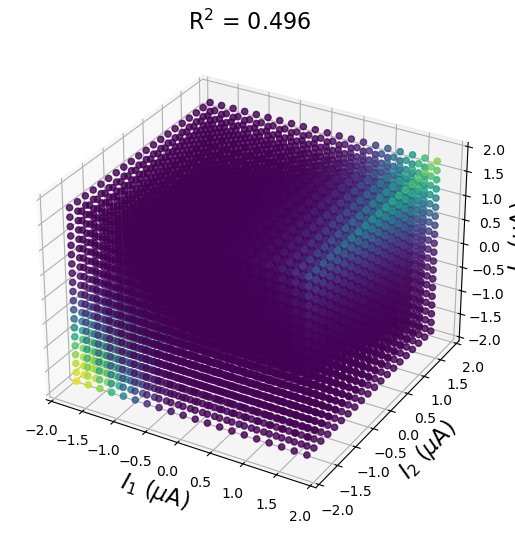

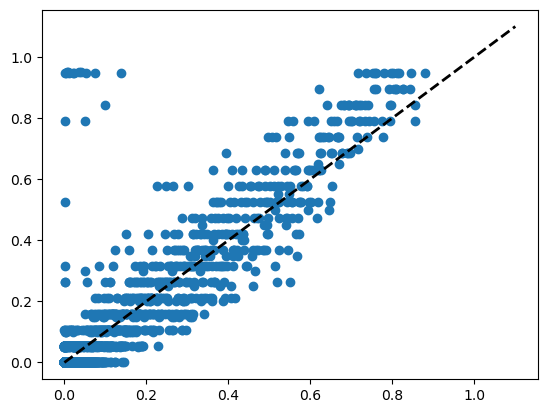

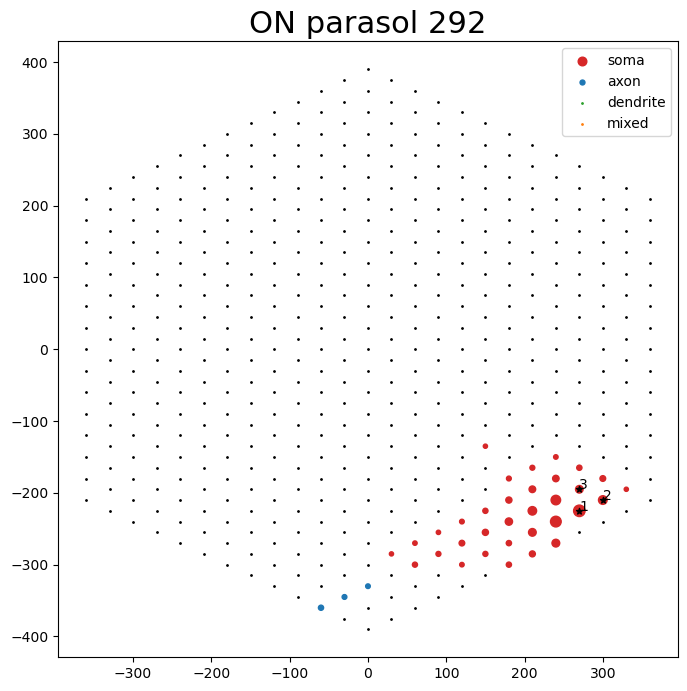

[list([array([[-12.06876557,   4.83989942,   1.04262341,   0.23450289],
        [-20.57348067, -12.34409312,  -1.28731713,   0.85863002]]), array([[-33.01153679,  -1.27289589, -18.49569303,  -3.86151305],
        [ -6.00283006,  -0.7817915 ,   0.07087002,   0.18051153],
        [-25.71253613,   1.16947929, -14.0923104 ,  -0.30598225],
        [-33.20675928,   2.35709623,  15.54795149,   3.95934556]]), array([[-20.85818615, -10.64375098,  -2.13276232,  -0.20171107],
        [ -7.26866745,   1.28658767,   0.55590654,   0.7551569 ]]), array([[-5.62949463, -3.31168343, -1.14878262, -1.12292231],
        [-5.29078277,  2.62972278,  0.94930385,  1.06330158]])])
 list([array([[-7.96728959, -1.61424806, -1.36291495, -6.52922908],
        [-8.68869853,  1.58201129,  1.32984258,  5.78957867]]), array([[-5.33209781,  0.74892752,  2.59587333,  2.53772803],
        [-5.34072629, -1.06995205, -2.88137146, -2.88567786]]), array([[ -8.84328726,  -2.50492745,  -4.38259553, -11.67113453],
        [-11.6

In [3]:
plot_thr_factor = 1

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if len(np.where(all_probs[i][j] > spont_limit)[0]) >= min_active_inds:
            print(cells[i], j+1)
            clean_inds = mutils.triplet_cleaning(amps[j], all_probs[i][j], trials[j],
                                                return_inds=True, dist_thr=0.15)

            above_spont = np.where(all_probs[i][j][clean_inds] >= spont_limit)[0]
            if len(above_spont) >= min_clean_inds:
                fig = plt.figure(0)
                fig.clear()
                ax = Axes3D(fig, auto_add_to_figure=False)
                fig.add_axes(ax)
                plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
                plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
                plt.xlim(-2, 2)
                plt.ylim(-2, 2)
                ax.set_zlim(-2, 2)
                ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

                scat = ax.scatter(amps[j][:, 0], 
                                    amps[j][:, 1],
                                    amps[j][:, 2], marker='o', 
                                    c=all_probs[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
                plt.show()

                fig = plt.figure(1)
                fig.clear()
                ax = Axes3D(fig, auto_add_to_figure=False)
                fig.add_axes(ax)
                plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
                plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
                plt.xlim(-2, 2)
                plt.ylim(-2, 2)
                ax.set_zlim(-2, 2)
                ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

                scat = ax.scatter(amps[j][clean_inds, 0], 
                                    amps[j][clean_inds, 1],
                                    amps[j][clean_inds, 2], marker='o', 
                                    c=all_probs[i][j][clean_inds], s=20, alpha=0.8, vmin=0, vmax=1)
                plt.show()

                w_inits = []
                for m in ms:
                    w_init = np.array(np.random.normal(size=(m, amps[j].shape[1]+1)))
                    z = 1 - (1 - zero_prob)**(1/len(w_init))
                    w_init[:, 0] = np.clip(w_init[:, 0], None, np.log(z/(1-z)))
                    w_init[:, 1:] = np.clip(w_init[:, 1:], -slope_bound, slope_bound)
                    w_inits.append(w_init)

                X, probs, T = deepcopy(amps[j][clean_inds]), deepcopy(all_probs[i][j][clean_inds]), deepcopy(trials[j][clean_inds])
                X_bin, y_bin = fitting.convertToBinaryClassifier(probs, T, X)
                opt_true, _  = fitting.fit_surface(X, probs, T, w_inits,
                                                            zero_prob=zero_prob,
                                                            slope_bound=slope_bound,
                                                            R2_thresh=R2_thresh)
                params_true, fun, R2 = opt_true

                print(params_true)
                probs_pred_true[i][j] = fitting.sigmoidND_nonlinear(
                                                            sm.add_constant(amps[j], has_constant='add'), 
                                                            params_true)
                pred_bin = fitting.sigmoidND_nonlinear(X_bin, params_true)
                R2_tjur_0 = np.sum(pred_bin[np.where(y_bin == 0)[0]]) / len(y_bin[np.where(y_bin == 0)[0]])
                R2_tjur_1 = np.sum(pred_bin[np.where(y_bin == 1)[0]]) / len(y_bin[np.where(y_bin == 1)[0]])
                R2_tjur = R2_tjur_1 - R2_tjur_0
                print(f'Tjur R2 = {R2_tjur:.3f}')
                params_true_array[i][j] = params_true
                
                fig = plt.figure(2)
                fig.clear()
                ax = Axes3D(fig, auto_add_to_figure=False)
                fig.add_axes(ax)
                plt.title(fr'R$^2$ = {R2:.3f}', fontsize=16)
                plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
                plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
                plt.xlim(-2, 2)
                plt.ylim(-2, 2)
                ax.set_zlim(-2, 2)
                ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

                scat = ax.scatter(amps[j][:, 0], 
                                    amps[j][:, 1],
                                    amps[j][:, 2], marker='o', 
                                    c=probs_pred_true[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
                plt.show()

                plt.figure(3)
                plt.scatter(probs_pred_true[i][j][clean_inds], all_probs[i][j][clean_inds])
                plt.plot(np.linspace(0, 1.1, 100), np.linspace(0, 1.1, 100), linestyle='--', color='k', linewidth=2)
                plt.show()

                fig, ax = plt.subplots(figsize=(8, 8))
                ax.scatter(coords[:, 0], coords[:, 1], s=1, c="k")

                good_inds, EI = mutils.get_collapsed_ei_thr(vcd, cells[i], plot_thr_factor)
                
                cell_ei = vcd.get_ei_for_cell(cells[i]).ei
                comp = []
                for k in range(len(cell_ei)):
                    comp.append(eil.axonorsoma(cell_ei[k]))
                comp = np.asarray(comp)

                soma_inds = good_inds[np.where(comp[good_inds] == 'soma')]
                axon_inds = good_inds[np.where(comp[good_inds] == 'axon')]
                dendrite_inds = good_inds[np.where(comp[good_inds] == 'dendrite')]
                mixed_inds = good_inds[np.where(comp[good_inds] == 'mixed')]

                ax.scatter(coords[soma_inds, 0], coords[soma_inds, 1], s=np.abs(EI[soma_inds]) * 2, c='tab:red', label='soma')
                ax.scatter(coords[axon_inds, 0], coords[axon_inds, 1], s=np.abs(EI[axon_inds]) * 2, c='tab:blue', label='axon')
                ax.scatter(coords[dendrite_inds, 0], coords[dendrite_inds, 1], s=np.abs(EI[dendrite_inds]) * 2,
                            c='tab:green', label='dendrite')
                ax.scatter(coords[mixed_inds, 0], coords[mixed_inds, 1], s=np.abs(EI[mixed_inds]) * 2,
                            c='tab:orange', label='mixed')
                plt.title(vcd.get_cell_type_for_cell(cells[i]) + " " + str(cells[i]), fontsize=22)
                plt.legend()
                
                stim_elecs = mutils.get_stim_elecs_newlv(electrical_path, j+1)
                for k, txt in enumerate(stim_elecs):
                    ax.annotate(k+1, (coords[stim_elecs[k]-1, 0], coords[stim_elecs[k]-1, 1]))
                
                ax.scatter(coords[stim_elecs-1, 0], coords[stim_elecs-1, 1], s=20, c="k", marker='*')
                
                plt.show()
                
                string_in = input()
                if string_in == '':
                    params_list_separated[j].append(params_true)
                    params_true_array[i][j] = params_true

                print(params_list_separated)

In [4]:
np.save(f'/Volumes/Lab/Users/praful/triplet-utils/results/params_array-{dataset}', params_true_array)

In [5]:
selectivities = []
for i in range(len(params_list_separated)):
    for j in range(len(params_list_separated[i])):
        selectivities.append(fitting.selectivity_triplet(params_list_separated[i], [j]))

In [6]:
selectivities

[(0.839962450171054, 0.3502967928981481),
 (0.9924564492447758, 0.7271879246449768),
 (0.08061506632554469, 0.024993068092430487),
 (0.8696829096061176, 0.3519210700218926),
 (0.16687506545089667, 0.023206417660347735),
 (0.5268786814242228, 0.33324871301223985),
 (0.8972224854932875, 0.8503831096189489),
 (0.6784140400255341, 0.02014670576287723),
 (0.12542680023774697, 0.05163040428068155),
 (0.5347347929584698, 0.16499617478579315),
 (0.17301394564619924, 0.052086650676345596),
 (0.06790631279278561, 0.013307340054201418),
 (0.08044195122046477, 0.0038339051590250855),
 (0.9949152093115446, 0.9806637435128881)]

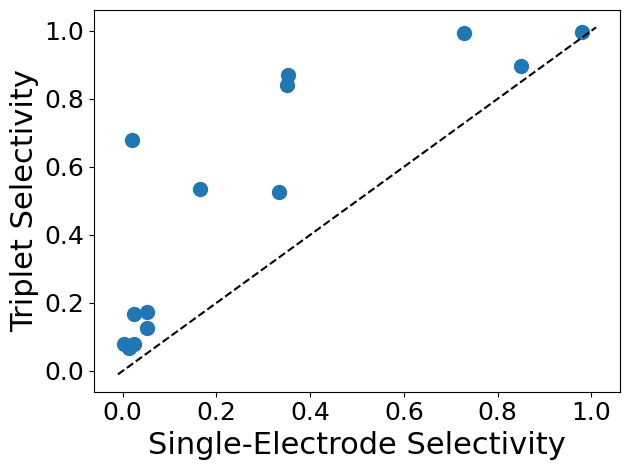

In [7]:
fig, ax = plt.subplots()
ax.scatter(np.array(selectivities)[:, 1], np.array(selectivities)[:, 0], s=100)
ax.plot(np.linspace(-0.01, 1.01, 100), np.linspace(-0.01, 1.01, 100), linestyle='--', c='k')
ax.set_xlabel('Single-Electrode Selectivity', fontsize=22)
ax.set_ylabel('Triplet Selectivity', fontsize=22)
ax.tick_params('both', labelsize=18)
fig.tight_layout() # Or equivalently,  "plt.tight_layout()"
plt.savefig(f'/Volumes/Lab/Users/praful/triplet-utils/results/selectivity-{dataset}.png', dpi=300)